In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from mediaug.dataset import Dataset
from mediaug.image_utils import read_png, add_img_on_img
from mediaug.visulize import show_image, plot_datapoint, plot_img_and_mask
import mediaug.image_utils as mutils

In [4]:
cells = Dataset('/Users/seanwade/projects/cancerDetection/data/sipakmed_processed/cells')
slides = Dataset('/Users/seanwade/projects/cancerDetection/data/sipakmed_processed/slides')

In [5]:
slide = slides['superficial-intermediate'][0]

In [6]:
cell = cells['metaplastic'][0]

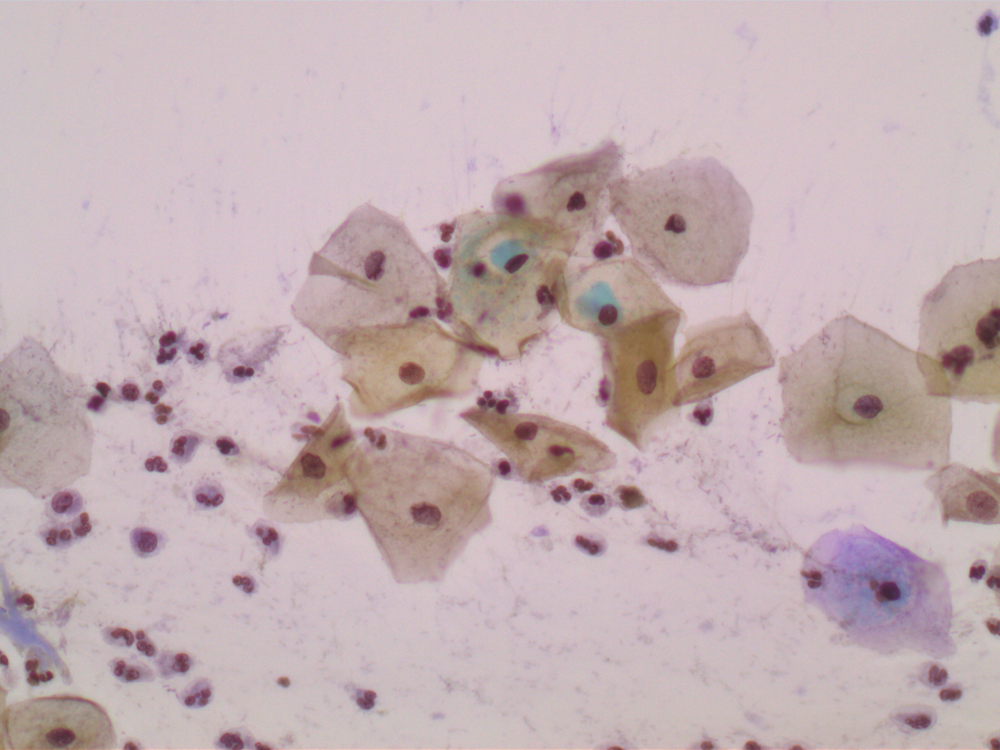

In [7]:
show_image(slide.img)

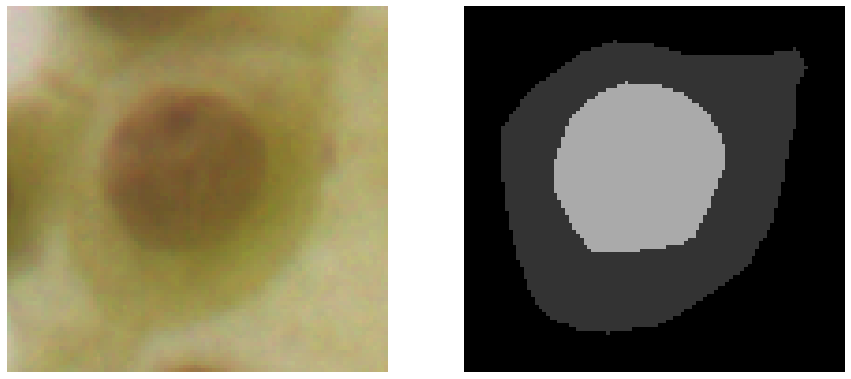

In [8]:
plot_datapoint(cell)

In [86]:
from mediaug.variables import *

In [87]:
ans = (cell.mask == COLOR_CYTO_MASK) | (cell.mask == COLOR_NUC_MASK)
ans = np.any(ans, axis=2).astype(int).astype(np.uint8)

In [88]:
ans.sum()

4886

In [92]:
ans

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [102]:
ans[ans==0] == 255

array([False, False, False, ..., False, False, False])

In [97]:
cell.mask.shape

(98, 102, 3)

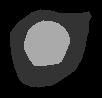

In [108]:
show_image(cell.mask)

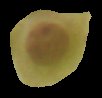

In [110]:
mask = cv2.cvtColor(cell.mask, cv2.COLOR_BGR2GRAY)
masked_data = cv2.bitwise_and(cell.img, cell.img, mask=mask)
show_image(masked_data)

In [134]:
slide_mask = cv2.cvtColor(slide.mask, cv2.COLOR_BGR2GRAY)
cell_mask = cv2.cvtColor(cell.mask, cv2.COLOR_BGR2GRAY)

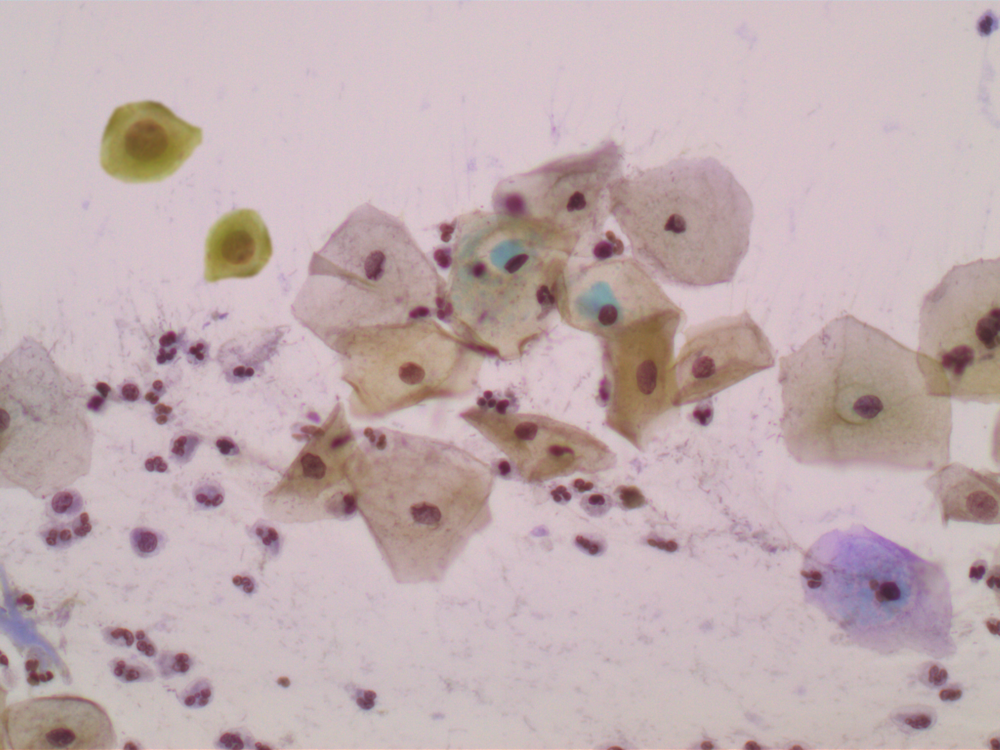

In [142]:
new_img, alpha = add_img_on_img(slide.img, slide_mask, cell.img, cell_mask, (300,300), 30, 2, 4)
new_img, alpha = add_img_on_img(new_img, slide_mask, cell.img, cell_mask, (500,480), 170, 1.6 ,3)

show_image(new_img)

In [135]:
np.unique(cell_mask)

array([  0,  51, 170], dtype=uint8)

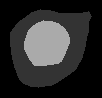

In [127]:
show_image(cell_mask)